In [1]:
import pandas as pd

df = pd.read_csv("../data/acled_middle_east_data.csv")

df.head()

/var/folders/8s/5kb_fl851lbfqsvhg3z5m8ww0000gn/T/ipykernel_70882/947444975.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp
0,ISR38558,15 December 2023,2023,1,Political violence,Battles,Armed clash,Hezbollah,NaN,3,...,Hanita,33.0875,35.1736,2,Haaretz; N12; Ynet,National,"On 15 December 2023, Hezbollah forces fired a ...",0,NaN,1704757982
1,ISR38626,15 December 2023,2023,1,Demonstrations,Protests,Protest with intervention,Protesters (Israel),NaN,6,...,Haifa,32.8184,34.9885,1,Haaretz,National,"On 15 December 2023, about 20 people protested...",0,crowd size=about 20,1704757982
2,PSE43394,15 December 2023,2023,1,Strategic developments,Strategic developments,Arrests,Military Forces of Israel (2022-),NaN,8,...,Mukhayyam Jabalya,31.5360,34.4907,1,Palestine News and Information Agency,National,"On 15 December 2023, Israeli military forces a...",0,NaN,1704757985
3,PSE43421,15 December 2023,2023,1,Political violence,Riots,Mob violence,Rioters (Palestine),Refugees/IDPs (Palestine),5,...,Al Quds - Mukhayyam Shuafat,31.8114,35.2458,1,PLO Negotiations Affairs Department,Other,"On 15 December 2023, Palestinian rioters clash...",0,crowd size=no report,1704757986
4,PSE43448,15 December 2023,2023,1,Political violence,Violence against civilians,Attack,Military Forces of Israel (2022-),NaN,8,...,Mukhayyam Jabalya,31.5360,34.4907,1,Palestine News and Information Agency,National,"On 15 December 2023, Israeli military forces o...",12,NaN,1704757986


In [2]:
df.columns

Index(['event_id_cnty', 'event_date', 'year', 'time_precision',
       'disorder_type', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'civilian_targeting', 'iso', 'region', 'country',
       'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude',
       'geo_precision', 'source', 'source_scale', 'notes', 'fatalities',
       'tags', 'timestamp'],
      dtype='object')

In [3]:
df.shape

(6709, 31)

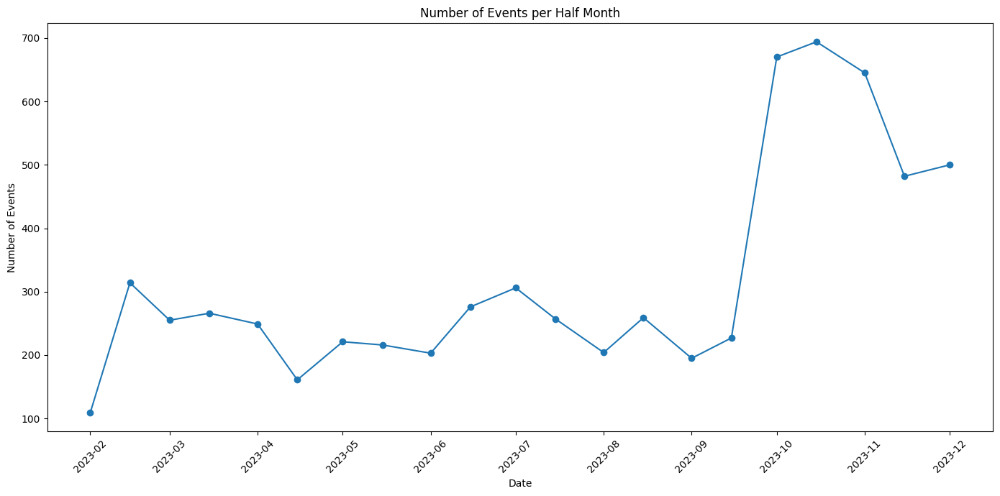

In [39]:
import matplotlib.pyplot as plt

df['event_date'] = pd.to_datetime(df['event_date'])

df['half_month'] = df['event_date'].apply(
    lambda x: x.replace(day=1) if x.day <= 15 else x.replace(day=15))

events_per_half_month = df.groupby('half_month').size()

plt.figure(figsize=(14, 7))
plt.plot(events_per_half_month.index, events_per_half_month, marker="o")
plt.title('Number of Events per Half Month')
plt.xlabel('Date')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [22]:
df['event_type'].value_counts()

event_type
Riots                         3344
Battles                       1578
Violence against civilians     780
Strategic developments         739
Protests                       268
Name: count, dtype: int64

In [26]:
df['event_type'].value_counts()[:3].index

Index(['Riots', 'Battles', 'Violence against civilians'], dtype='object', name='event_type')

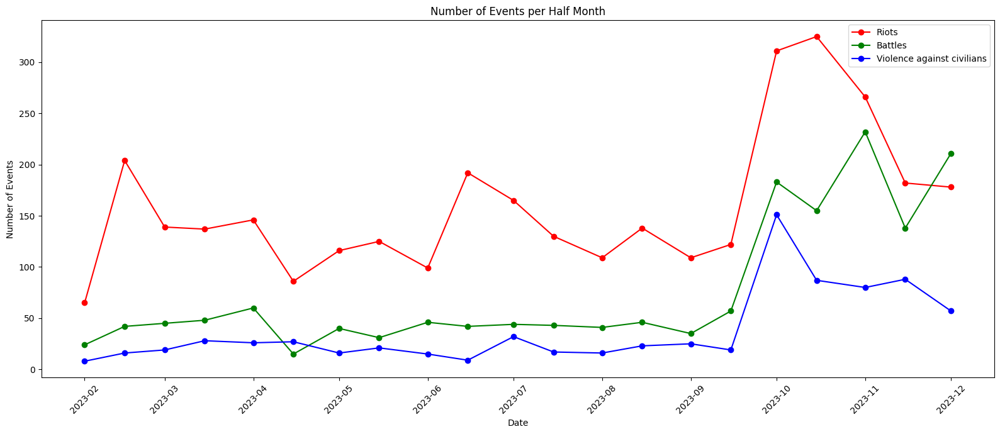

In [31]:
def get_half_month_occurences(column_name):
    return df.loc[df['event_type'] == column_name].groupby("half_month").size()


colors = ["r", "g", "b"]
events = df['event_type'].value_counts()[:3].index

plt.figure(figsize=(16, 7))

for i in range(0, 3):
    events_series = get_half_month_occurences(events[i])
    plt.plot(events_series.index, events_series, marker="o",
             color=colors[i], label=events[i])


plt.title('Number of Events per Half Month')
plt.xlabel('Date')
plt.ylabel('Number of Events')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend()
plt.show()

In [6]:
import folium


def get_color(event_type):
    # label most commonly occuring events; everything else is lumped
    if event_type == 'Riots':
        return 'red'
    elif event_type == 'Battles':
        return 'blue'
    elif event_type == 'Violence against civilians':
        return 'green'
    else:
        return 'yellow'


# center map; carto -> english labels
middle_east_map = folium.Map(
    location=[31.0461, 34.8516], tiles='CartoDB Positron', zoom_start=5)

for idx, row in df.iterrows():
    event_color = get_color(row['event_type'])
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=event_color,
        fill=True,
        fill_color=event_color,
        fill_opacity=0.7,
        popup=f"Event Type: {row['event_type']}<br>Date: {row['event_date'].date()}<br>Location: {row['location']}"
    ).add_to(middle_east_map)


map_file_path = '../visualizations/middle_east_events_map.html'
middle_east_map.save(map_file_path)

middle_east_map

In [32]:
actor1_counts = df['actor1'].value_counts().head(10)  # top 10 primary actors
assoc_actor1_counts = df['assoc_actor_1'].dropna(
).value_counts().head(10)  # top ten associated actors

actor1_counts, assoc_actor1_counts

(actor1
 Rioters (Palestine)                     2174
 Rioters (Israel)                        1166
 Military Forces of Israel (2022-)        902
 Unidentified Armed Group (Palestine)     790
 Settlers (Israel)                        362
 Hamas Movement                           328
 Protesters (Israel)                      206
 Al Aqsa Martyrs Brigade                  188
 Police Forces of Israel (2022-)          116
 Katibat Jenin                             71
 Name: count, dtype: int64,
 assoc_actor_1
 Settlers (Israel)                                       947
 Refugees/IDPs (Palestine)                               199
 Settlers (Israel); Military Forces of Israel (2022-)    187
 Rioters (Palestine)                                     160
 Military Forces of Israel (2022-)                        42
 Refugees/IDPs (Palestine); Rioters (Palestine)           36
 PIJ: Palestinian Islamic Jihad                           34
 Kaplan Force                                             32
 

In [33]:
fatalities_by_event_type = df.groupby(
    'event_type')['fatalities'].sum().sort_values(ascending=False)

deadliest_incidents = df.nlargest(5, 'fatalities')[
    ['event_date', 'event_type', 'location', 'fatalities']]
fatalities_by_year = df.groupby('year')['fatalities'].sum()

fatalities_summary = {
    'Fatalities by Event Type': fatalities_by_event_type,
    'Deadliest Incidents': deadliest_incidents,
    'Fatalities by Year': fatalities_by_year
}

fatalities_summary

{'Fatalities by Event Type': event_type
 Battles                       1267
 Violence against civilians     750
 Riots                           95
 Protests                         0
 Strategic developments           0
 Name: fatalities, dtype: int64,
 'Deadliest Incidents':      event_date                  event_type    location  fatalities
 2888 2023-10-07  Violence against civilians        Reim         347
 2871 2023-10-07                     Battles       Beeri         130
 2879 2023-10-07                     Battles    Nahal Oz          79
 2886 2023-10-07                     Battles        Sufa          75
 2872 2023-10-07  Violence against civilians  Kefar Azza          52,
 'Fatalities by Year': year
 2023    2112
 Name: fatalities, dtype: int64}

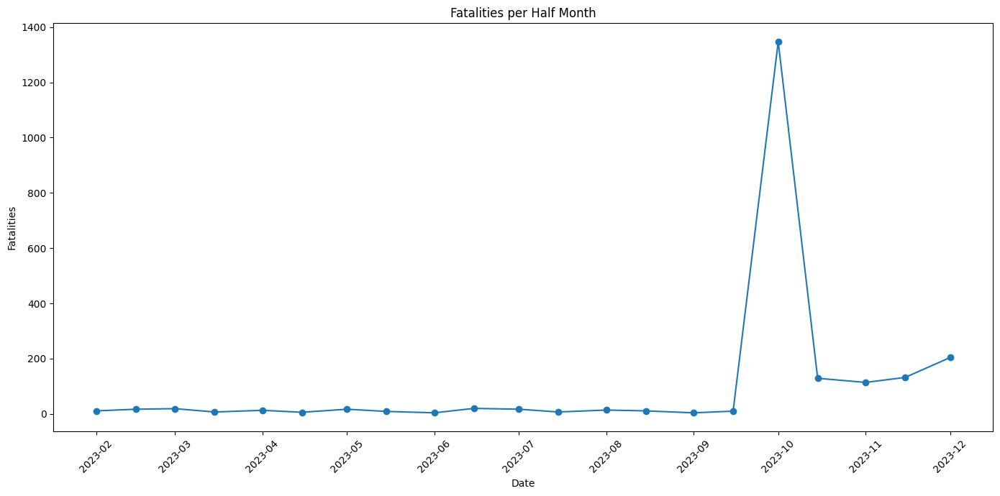

In [42]:
average_fatalities_per_half_month = df.groupby('half_month')[
    'fatalities'].sum()

plt.figure(figsize=(14, 7))
plt.plot(average_fatalities_per_half_month.index,
         average_fatalities_per_half_month, marker="o")
plt.title('Fatalities per Half Month')
plt.xlabel('Date')
plt.ylabel('Fatalities')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [50]:
# event_id_cnty contents not important - just checking frequency of events
sub_event_type_agg = df.groupby('sub_event_type').agg({
    'fatalities': 'sum',
    'event_id_cnty': 'count'
}).rename(columns={'event_id_cnty': 'event_count'}).sort_values(by='event_count', ascending=False)

sub_event_type_agg

,fatalities,event_count
sub_event_type,,
Mob violence,95,3344
Armed clash,1267,1578
Attack,750,778
Looting/property destruction,0,689
Protest with intervention,0,251
Arrests,0,50
Excessive force against protesters,0,17
Abduction/forced disappearance,0,2


In [53]:
df.head(1)

,event_id_cnty,event_date,year,time_precision,disorder_type,event_type,sub_event_type,actor1,assoc_actor_1,inter1,...,longitude,geo_precision,source,source_scale,notes,fatalities,tags,timestamp,half_month,month_year
0,ISR38558,2023-12-15,2023,1,Political violence,Battles,Armed clash,Hezbollah,NaN,3,...,35.1736,2,Haaretz; N12; Ynet,National,"On 15 December 2023, Hezbollah forces fired a ...",0,NaN,1704757982,2023-12-01,2023-12


In [57]:
df['month_year'] = df['event_date'].dt.to_period('M')

top_active_actors = [
    'Rioters (Palestine)', 'Rioters (Israel)', 'Military Forces of Israel (2022-)']

# filter by month
longitudinal_actor_behavior = df[df['actor1'].isin(
    top_active_actors)].groupby(['actor1', 'half_month']).size().unstack(fill_value=0)

longitudinal_actor_behavior

half_month,2023-02-01,2023-02-15,2023-03-01,2023-03-15,2023-04-01,2023-04-15,2023-05-01,2023-05-15,2023-06-01,2023-06-15,...,2023-07-15,2023-08-01,2023-08-15,2023-09-01,2023-09-15,2023-10-01,2023-10-15,2023-11-01,2023-11-15,2023-12-01
actor1,,,,,,,,,,,,,,,,,,,,,
Military Forces of Israel (2022-),6,19,14,19,17,15,46,26,26,14,...,26,23,25,16,17,133,136,105,123,71
Rioters (Israel),35,82,55,53,60,28,24,38,34,106,...,53,38,61,29,29,106,143,64,43,26
Rioters (Palestine),30,121,84,84,86,58,91,87,65,85,...,77,71,77,80,93,204,182,202,139,152


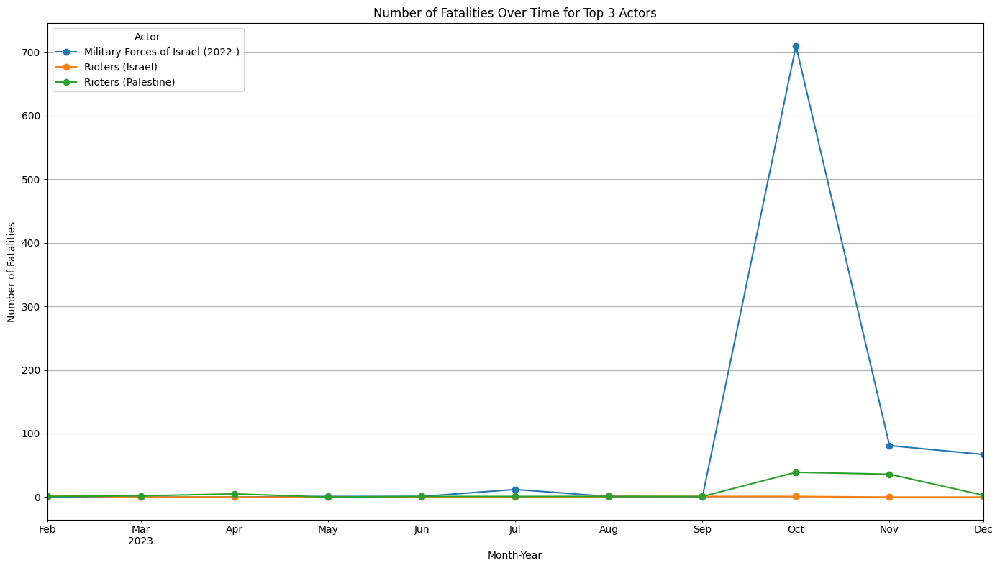

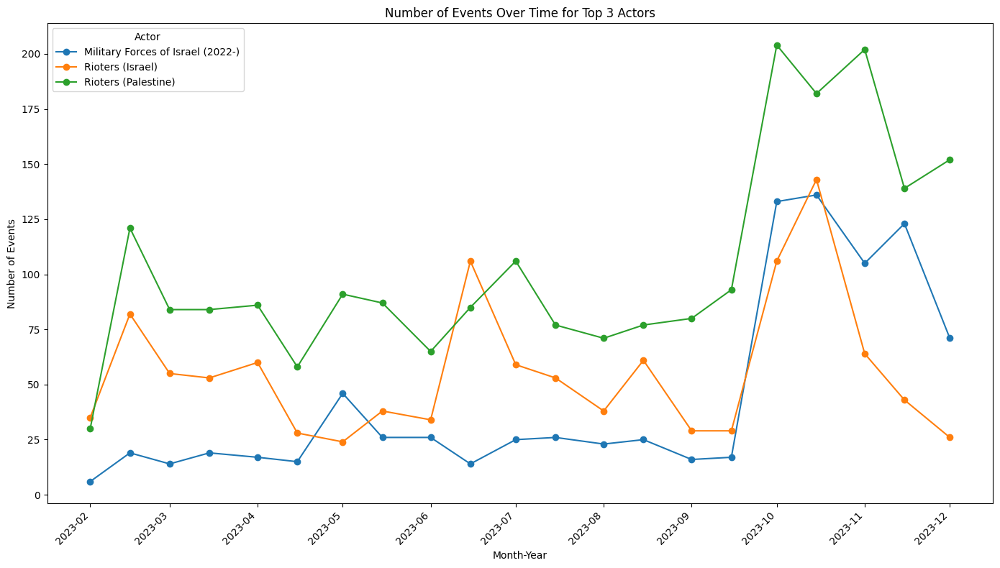

In [59]:
# data for top 3 actors
top_3_actors_fatalities = df[df['actor1'].isin(top_active_actors)].groupby(
    ['actor1', 'month_year'])['fatalities'].sum().unstack(fill_value=0).T

fig, ax = plt.subplots(figsize=(14, 8))
top_3_actors_fatalities.plot(ax=ax, marker='o', linestyle='-')
ax.set_title('Number of Fatalities Over Time for Top 3 Actors')
ax.set_xlabel('Month-Year')
ax.set_ylabel('Number of Fatalities')
ax.legend(title='Actor')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

# top 3 different actors vs events over time
top_3_actors_events = longitudinal_actor_behavior.T

fig, ax = plt.subplots(figsize=(14, 8))
top_3_actors_events.plot(ax=ax, marker='o', linestyle='-')
ax.set_title('Number of Events Over Time for Top 3 Actors')
ax.set_xlabel('Month-Year')
ax.set_ylabel('Number of Events')
ax.legend(title='Actor')
plt.xticks(rotation=45)
plt.grid(False)
plt.tight_layout()
plt.show()